# 阈值分割

## 基于灰度的阈值分割

101.0


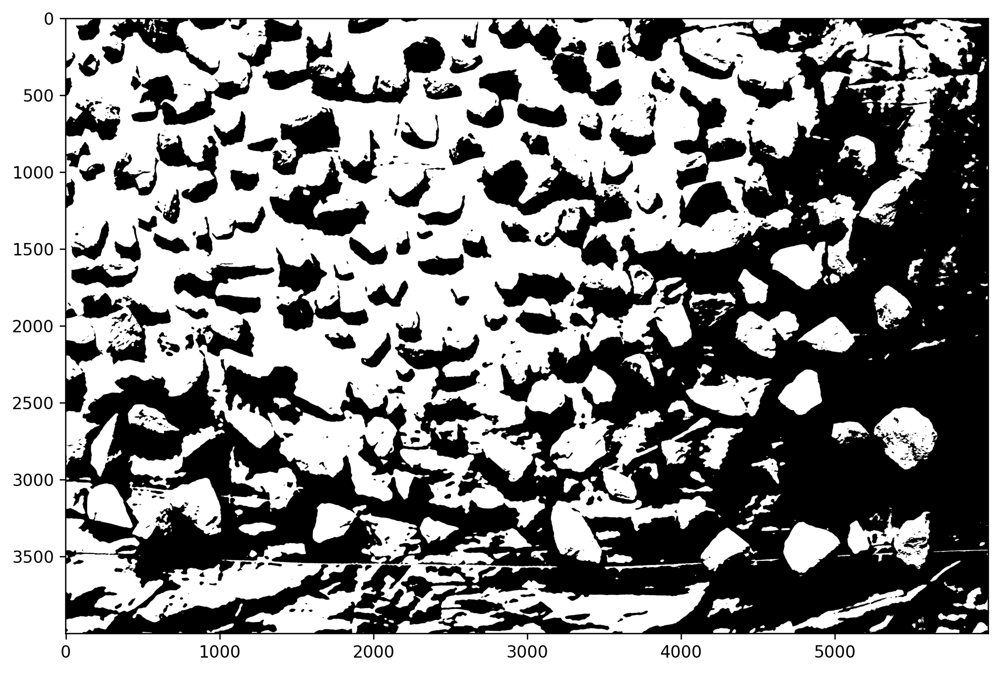

In [41]:
import cv2
import numpy as np
from matplotlib import pyplot as plt

img = cv2.imread('/Users/panyining/Desktop/stones/IMG_3668.JPG', 0)
img = cv2.cvtColor(img, cv2.COLOR_GRAY2BGR)

# img = cv2.medianBlur(img, 5)
# img = cv2.GaussianBlur(img, (5, 7), 1)
img = cv2.fastNlMeansDenoisingColored(img, None, 10, 10, 7, 21)
img = cv2.medianBlur(img, 5)

ret, th1 = cv2.threshold(img, 101, 255, cv2.THRESH_BINARY)
plt.figure(figsize=(10, 8), dpi=240)
print(ret)
plt.imshow(th1)

# th1 = cv2.fastNlMeansDenoisingColored(th1, None, 10, 10, 7, 21)
# th2 = cv2.adaptiveThreshold(img, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, 11, 2)
# th3 = cv2.adaptiveThreshold(img, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 11, 2)
# titles = ['Original', 'Global Thresholding(v = 127)', 'Adaptive Mean Thresholding', 'Adaptive Gaussian Thresholding']
# images = [img, th1, th2, th3]
# for i in range(4):
#     plt.subplot(2, 2, i + 1), plt.imshow(images[i], 'gray')
#     plt.title(titles[i])
#     plt.xticks([]), plt.yticks([])
# plt.show()


# cv2.imwrite("./img/threshold_22.jpg", th1)


## 基于RGB的阈值分割

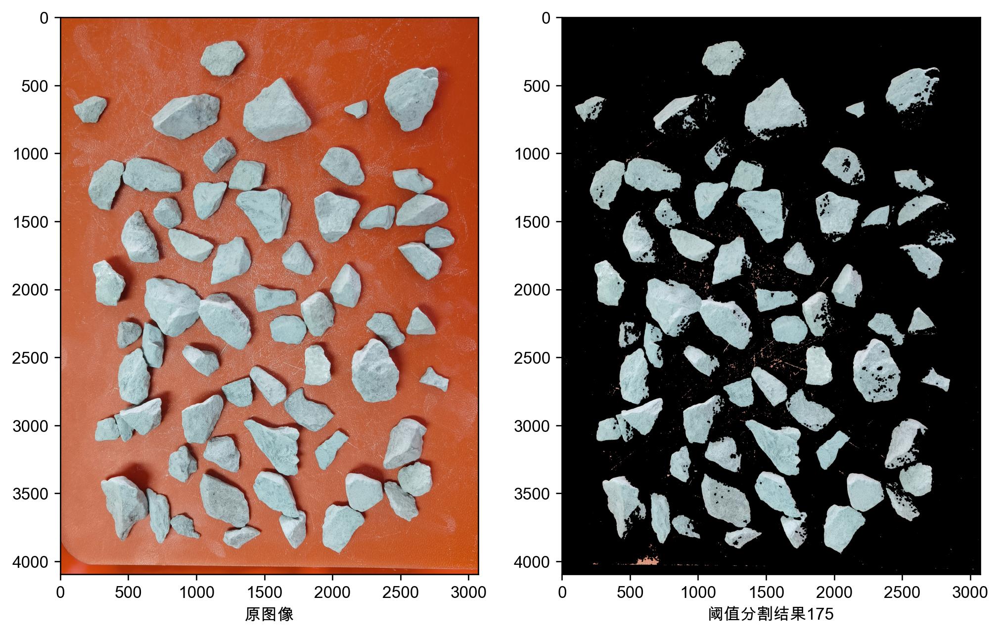

In [21]:
# coding:utf-8
'''
彩色图像的阈值分割
'''
from skimage import io, img_as_ubyte
from skimage.color import rgb2gray
from skimage.morphology import opening, disk
import numpy as np
import matplotlib.pyplot as plt

# 读取彩色图像，并将图像类型设置为8位（0-255）
img = img_as_ubyte(io.imread('/Users/panyining/Desktop/test2.jpg'))
# 转换成灰度图像（类型自动转为0~1或-1~1），并将图像类型设置为8位
img_gray = img_as_ubyte(rgb2gray(img))
# 读取灰度图像的高h和宽w
h, w = img_gray.shape

# 设置阈值
segm1 = (img_gray < 175)

# 开运算
kernel = disk(5) 
img_opening = opening(segm1, kernel)
# 将单通道阈值，转为RGB通道的阈值，x轴扩大3倍
segm = np.tile(img_opening.reshape(h, w, 1), 3)

# 复制一份彩色图像
img1 = img.copy()
# 掩膜操作
img1[segm] = 0

# 显示图像
# plt.rcParams['font.sans-serif'] = ['Arial Unicode MS']
# plt.rcParams['axes.unicode_minus']=False   #这两行需要手动设置
plt.figure(figsize=(10, 8), dpi=240)
plt.subplot(121)
plt.imshow(img)
plt.xlabel("原图像", fontproperties='Arial Unicode MS')
plt.subplot(122)
plt.imshow(img1)
plt.xlabel("阈值分割结果175", fontproperties='Arial Unicode MS')
plt.show()


## OTSU自适应阈值

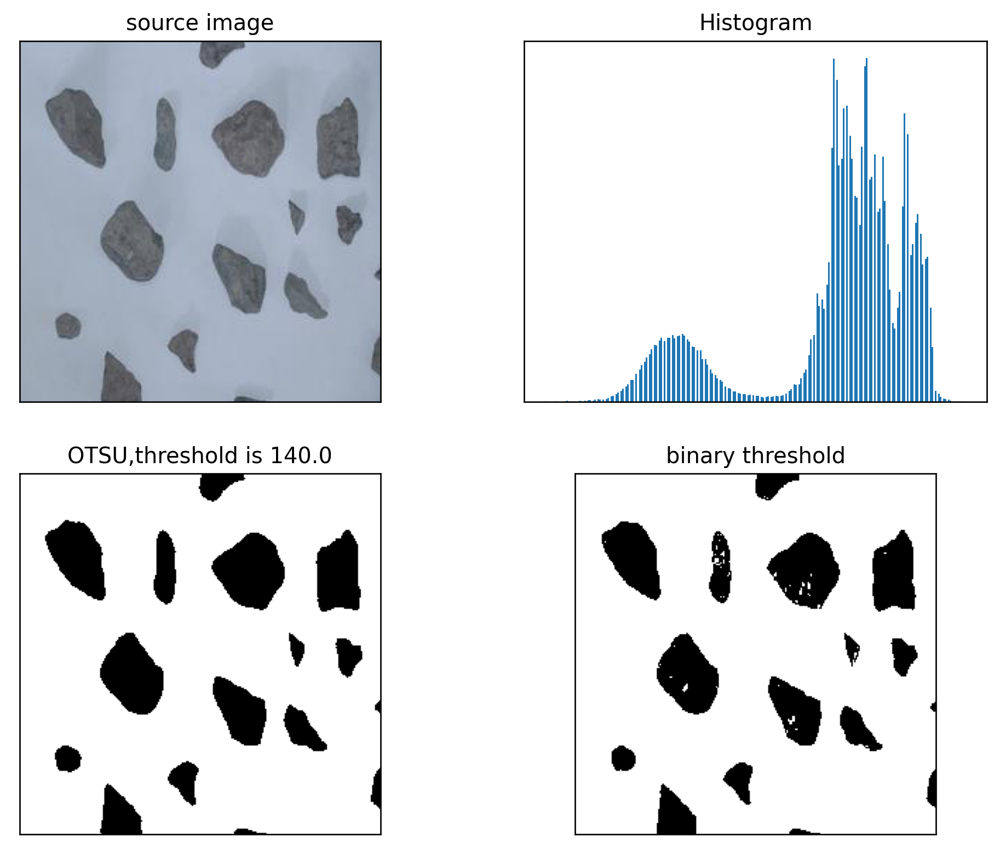

True

In [7]:
'''
灰度图的自动阈值OTSU
'''
import cv2
import numpy as np
from matplotlib import pyplot as plt

image = cv2.imread('/Users/panyining/Desktop/stones/dataset/0805/IMG_3714.JPG')
image = cv2.cvtColor(image, cv2.COLOR_RGB2BGR)
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

plt.figure(figsize=(10, 8), dpi=240)
plt.subplot(221), plt.imshow(image, 'gray')
plt.title('source image'), plt.xticks([]), plt.yticks([])
plt.subplot(222), plt.hist(image.ravel(), 256)
plt.title('Histogram'), plt.xticks([]), plt.yticks([])
ret1, th1 = cv2.threshold(gray, 0, 255, cv2.THRESH_OTSU)  # 方法选择为THRESH_OTSU
ret2, th2 = cv2.threshold(gray, 120, 255, cv2.THRESH_BINARY)

plt.subplot(223), plt.imshow(th1, 'gray')
plt.title('OTSU,threshold is ' + str(ret1)), plt.xticks([]), plt.yticks([])
plt.subplot(224), plt.imshow(th2, 'gray')
plt.title('binary threshold'), plt.xticks([]), plt.yticks([])
plt.show()

cv2.imwrite("/Users/panyining/Desktop/IMG_3714_otsu2.jpg", th1)

## 三角阈值法

KeyboardInterrupt: 

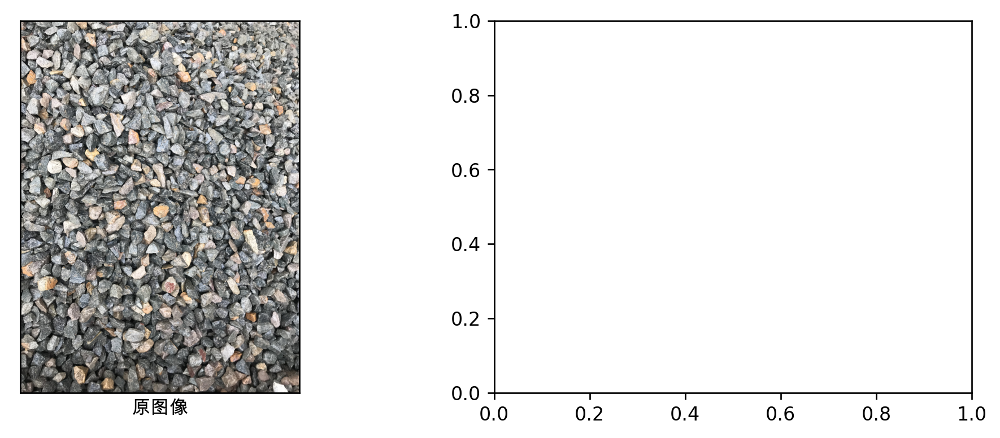

In [33]:
import cv2
import matplotlib.pyplot as plt

img = cv2.imread('/Users/panyining/Desktop/test.jpg')

gray_img = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

# otsu阈值
(t,thresh) = cv2.threshold(gray_img,0,255,cv2.THRESH_TOZERO_INV+cv2.THRESH_OTSU)
# 三角法阈值：由直方图凹凸性确定的阈值
(t,thresh1) = cv2.threshold(gray_img,0,255,cv2.THRESH_TOZERO_INV+cv2.THRESH_TRIANGLE)

# 形态学操作
kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE,(10,10))
kernel1 = cv2.getStructuringElement(cv2.MORPH_ELLIPSE,(7,7))
thresh = cv2.morphologyEx(thresh,cv2.MORPH_CLOSE,kernel)
thresh1 = cv2.morphologyEx(thresh1,cv2.MORPH_CLOSE,kernel1)

# 颜色空间转换：BGR转RGB
img1 = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
result = cv2.cvtColor(cv2.bitwise_and(img, img,mask=thresh),cv2.COLOR_BGR2RGB)
result1 = cv2.cvtColor(cv2.bitwise_and(img, img,mask=thresh1),cv2.COLOR_BGR2RGB)

# 图像显示
plt.figure(figsize=(10,8),dpi=240)
plt.subplot(221)
plt.imshow(img1)
plt.xlabel("原图像", fontproperties='Arial Unicode MS')
plt.yticks([])
plt.xticks([])
plt.subplot(222)
plt.hist(gray_img.flat,bins=255,range=(0,256))
plt.xlabel("灰度直方图",fontproperties='Arial Unicode MS')
plt.xlim(0,255)
plt.subplot(223)
plt.imshow(result)
plt.xlabel("OTSU阈值",fontproperties='Arial Unicode MS')
plt.yticks([])
plt.xticks([])
plt.subplot(224)
plt.imshow(result1)
plt.xlabel("三角法阈值",fontproperties='Arial Unicode MS')
plt.yticks([])
plt.xticks([])
plt.show()


## 遗传算法的阈值
https://blog.csdn.net/u010128736/article/details/52801310/

[0, 1, 16, 151, 256]


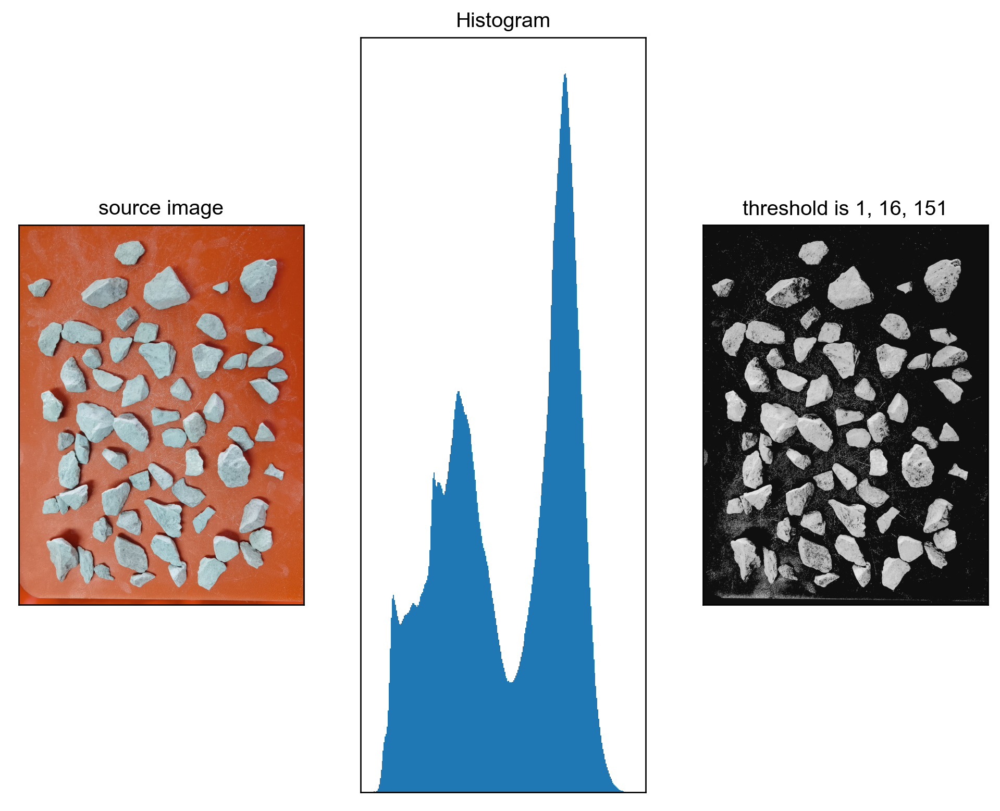

In [35]:
#coding:utf-8
import cv2
import numpy as np
from matplotlib import pyplot as plt
import random


#将不足8*m位的染色体扩展为8*m位
def expand(k, m):
    for i in range(len(k)):
        k[i] = k[i][:2] + '0'*(8*m+2 - len(k[i])) + k[i][2:len(k[i])]
    return k


def Hist(image):
    a=[0]*256
    h=image.shape[0]
    w=image.shape[1]
    MN=h*w
    average=0.0
    for i in range(w):
        for j in range(h):
            pixel=int(image[j][i])
            a[pixel]=a[pixel]+1
    for i in range(256):
        a[i]=a[i]/float(MN)
        average=average+a[i]*i
    return a, average


#解析多阈值基因串
def getTh(seed, m):
    th = [0, 256]
    seedInt = int(seed, 2)
    for i in range(0, m):
        tmp = seedInt & 255
        if tmp != 0:
            th.append(tmp)
        seedInt = seedInt >> 8
    th.sort()
    return th


#适应度函数 Ostu全局算法
def fitness(seed, p, average, m):
    Var = [0.0] * len(seed)
    g_muT = 0.0

    for i in range(256):
        g_muT = g_muT + i * p[i]

    for i in range(len(seed)):
        th = getTh(seed[i], m)
        for j in range(len(th)-1):
            w = [0.0] * (len(th)-1)
            muT = [0.0] * (len(th)-1)
            mu = [0.0] * (len(th)-1)
            for k in range(th[j], th[j+1]):
                w[j] = w[j] + p[k]
                muT[j] = muT[j] +  + p[k] * k
            if w[j] > 0:
                mu[j] = muT[j] / w[j]
                Var[i] = Var[i] + w[j] * pow(mu[j] - g_muT, 2)
    return Var


#选择算子 轮盘赌选择算法
def wheel_selection(seed, Var):
    var = [0.0]*len(Var)
    s = 0.0
    n = ['']*len(seed)
    sumV = sum(Var)
    for i in range(len(Var)):
        var[i] = Var[i]/sumV
    for i in range(1, len(Var)):
        var[i] = var[i] + var[i-1]
    for i in range(len(seed)):
        s = random.random()
        for j in range(len(var)):
            if s <= var[j]:
                n[i] = seed[j]
    return n


#单点交叉算子
def Cross(Next, m):
    for i in range(0, len(Next) - 1, 2):
        if random.random() < 0.7:
            if m > 2:
                tmp = Next[i][10:]
                Next[i] = Next[i][:10] + Next[i+1][10:]
                Next[i+1] = Next[i+1][:10] + tmp
            else:
                tmp = Next[i][6:]
                Next[i] = Next[i][:6] + Next[i+1][6:]
                Next[i+1] = Next[i+1][:6] + tmp
    return Next


#变异算子
def Variation(Next):
    for i in range(len(Next)):
        if random.random()<0.06:
            Next[i]=bin(int(Next[i],2)+2)
    return Next


#多阈值分割
def genetic_thres(image, k, m):
    th = image
    for i in range(image.shape[0]):
        for j in range(image.shape[1]):
            for t in range(1, len(k)-1):
                if k[t-1] <= image[i][j] < k[t]:
                    th[i][j] = int(k[t-1])
    return th


# main
imagesrc = cv2.imread('/Users/panyining/Desktop/test2.jpg')
image = cv2.cvtColor(imagesrc, cv2.COLOR_BGR2RGB)
gray = cv2.cvtColor(imagesrc, cv2.COLOR_BGR2GRAY)

m = 3  #阈值数
items_x = list(range(0, imagesrc.shape[0]))
items_y = list(range(0, imagesrc.shape[1]))
random.shuffle(items_x)
random.shuffle(items_y)
x = items_x[0:20*m]  #产生随机x坐标
y = items_y[0:20*m]  #产生随机y坐标
seed = []
Var = 0.0
times = 0
k = 0
P, average = Hist(gray)  #计算直方图，P为各灰度的概率的数组，average为均值
for i in range(0, 20):
    code = int(0)
    for j in range(0, m):
        code = code + gray[x[i*j]][y[i*j]] << j*8  #将阈值连起来组成一个8*m比特的基因串
    seed.append(bin(code))  #生成第一代

while times < 2000:
    Var = fitness(seed, P, average, m)
    Next = wheel_selection(seed, Var)
    Next = Cross(Next, m)
    Next = expand(Variation(Next), m)
    seed = Next
    times = times + 1

for j in range(len(Var)):
    if Var[j] == max(Var):
        k = getTh(Next[j], m)
print(k)

plt.figure(figsize=(10,8),dpi=240)
plt.subplot(131), plt.imshow(image, "gray")
plt.title("source image"), plt.xticks([]), plt.yticks([])
plt.subplot(132), plt.hist(image.ravel(), 256)
plt.title("Histogram"), plt.xticks([]), plt.yticks([])
th1 = genetic_thres(gray, k, m)
plt.subplot(133), plt.imshow(th1, "gray")
titleName = ''
for i in range(1, len(k)-1):
    titleName = titleName + str(k[i]) + ', '
titleName = titleName[:len(titleName)-2]
plt.title("threshold is " + titleName), plt.xticks([]), plt.yticks([])
plt.show()


## 开闭运算
https://blog.csdn.net/sunny2038/article/details/9137759

https://www.cnblogs.com/cyt99/p/12483580.html

True

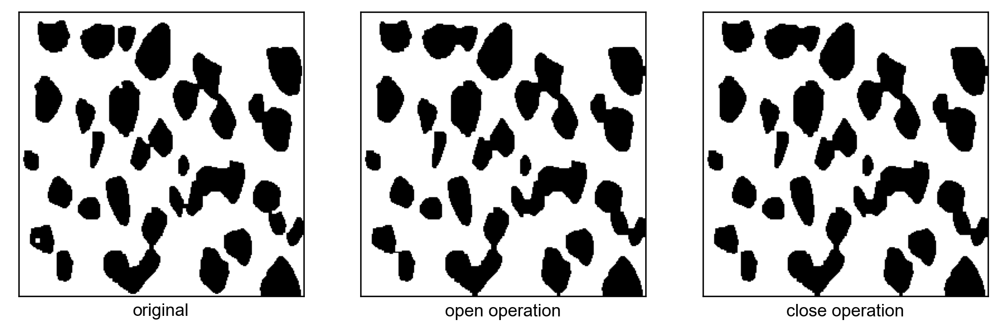

In [35]:
import numpy as np
import cv2 as cv
from matplotlib import pyplot as plt
from PIL import Image
filePic = '/Users/panyining/Desktop/stones/dataset/0805_OTSU/IMG_3870.png'
gray=cv.imread(filePic)

#反二值化，小于127设为255，即黑变白；大于127的设为 0，即白变黑。
# ret,img2=cv.threshold(gray,127,255,cv.THRESH_BINARY_INV)

#定义一个卷积核
kernel=np.ones((3,3),np.uint8)
kernel2=np.ones((3,3),np.uint8)

#开/闭运算
opening2=cv.morphologyEx(gray,cv.MORPH_OPEN,kernel)
closing2=cv.morphologyEx(opening2,cv.MORPH_CLOSE,kernel2)

#图像腐蚀：cv2.dilate(输入图像，卷积核，iterations=腐蚀的次数)
dilation=cv.dilate(opening2,kernel2,iterations=1)

plt.figure(figsize=(10, 8),dpi=240)
plt.subplot(131)
plt.imshow(gray)
plt.xlabel('original', fontproperties='Arial Unicode MS')
plt.yticks([])
plt.xticks([])
plt.subplot(132)
plt.imshow(opening2)
plt.xlabel('open operation', fontproperties='Arial Unicode MS')
plt.yticks([])
plt.xticks([])
plt.subplot(133)
plt.imshow(closing2)
plt.xlabel('close operation', fontproperties='Arial Unicode MS')
plt.yticks([])
plt.xticks([])

# cv2.imwrite(filePic, opening2)

# 边缘检测

(Text(0.5, 1.0, 'source image'), ([], []), ([], []))

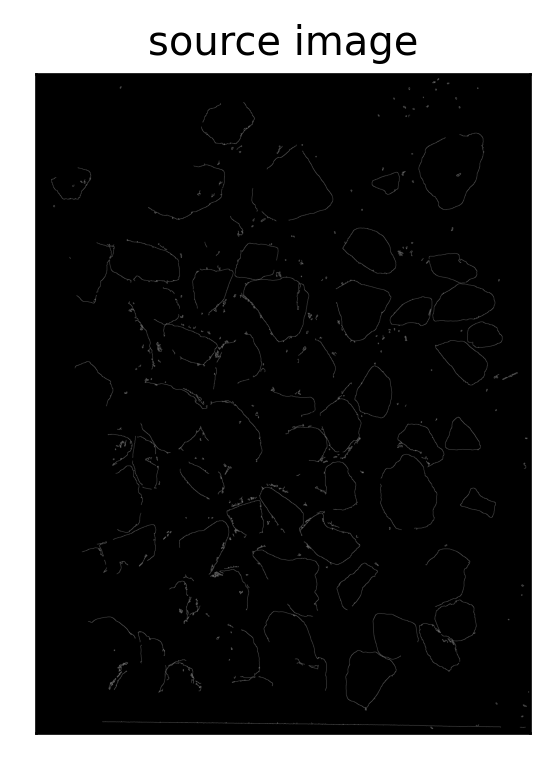

In [9]:
import cv2
import numpy as np

img = cv2.imread('/Users/panyining/Desktop/test_hist2.jpg', 0)
# img = cv2.cvtColor(img, cv2.COLOR_GRAY2RGB)

# cv2.imwrite("./canny2.jpg", cv2.Canny(img, 200, 300))
# cv2.imshow("canny", cv2.imread("canny2.jpg"))
# cv2.waitKey()
# cv2.destroyAllWindows()
canny = cv2.Canny(img, 300, 850)
image = canny
plt.figure(figsize=(10, 8), dpi=240)
plt.subplot(221), plt.imshow(image, 'gray')
plt.title('source image'), plt.xticks([]), plt.yticks([])

## canny—带滑动条的阈值

In [30]:
from __future__ import print_function
import cv2 as cv
import argparse
max_lowThreshold = 100
window_name = 'Edge Map'
title_trackbar = 'Min Threshold:'
ratio = 3
kernel_size = 3
def CannyThreshold(val):
    low_threshold = val
    #img_blur = cv.blur(src_gray, (3,3))
    detected_edges = cv.Canny(src_gray, low_threshold, low_threshold*ratio, kernel_size)
    mask = detected_edges != 0
    dst = src * (mask[:,:,None].astype(src.dtype))
    cv.imshow(window_name, dst)

src = cv.imread('/Users/panyining/Desktop/test_hist.jpg')
src = cv.GaussianBlur(src, (3, 3), 0)
src_gray = cv.cvtColor(src, cv.COLOR_BGR2GRAY)
cv.namedWindow(window_name)
cv.createTrackbar(title_trackbar, window_name , 0, max_lowThreshold, CannyThreshold)
CannyThreshold(0)
cv.waitKey()

106

# 直方图均值化

In [ ]:
cv2.equalizeHist(img)

## 三通道直方图均值化

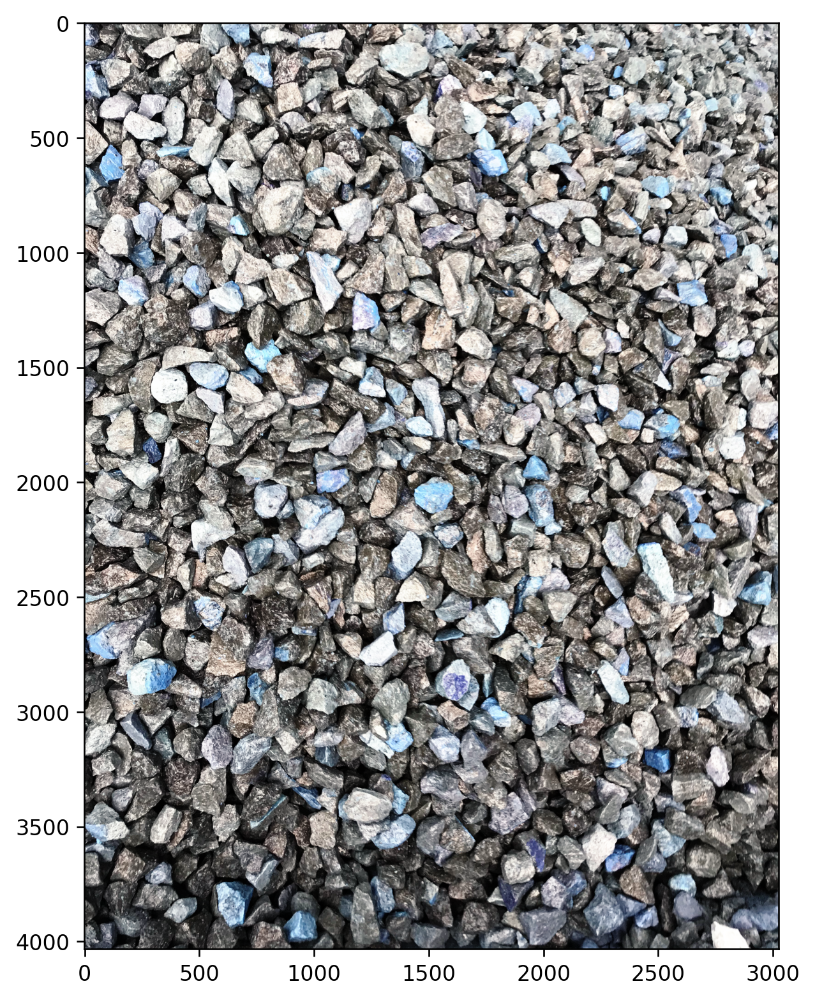

In [3]:
# 直方图均衡化
frame = cv2.imread('/Users/panyining/Desktop/test.jpg')
(b, g, r) = cv2.split(frame)
bH = cv2.equalizeHist(b)
gH = cv2.equalizeHist(g)
rH = cv2.equalizeHist(r)
frameH = cv2.merge((bH, gH, rH))

plt.figure(figsize=(10, 8), dpi=240)
plt.imshow(frameH)

## 绘制直方图
https://blog.csdn.net/dugudaibo/article/details/84450615

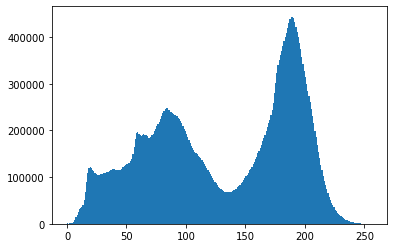

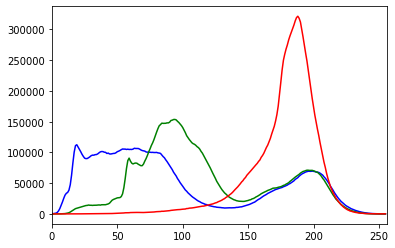

In [3]:
#-*- coding:utf-8 -*-

import cv2
from matplotlib import pyplot as plt

def whole_hist(image):
    '''
    绘制整幅图像的直方图
    '''
    plt.hist(image.ravel(), 256, [0, 256]) #numpy的ravel函数功能是将多维数组降为一维数组
    plt.show()

def channel_hist(image):
    '''
    画三通道图像的直方图
    '''
    color = ('b', 'g', 'r')   #这里画笔颜色的值可以为大写或小写或只写首字母或大小写混合
    for i , color in enumerate(color):
        hist = cv2.calcHist([image], [i], None, [256], [0, 256])  #计算直方图
        plt.plot(hist, color)
        plt.xlim([0, 256])
    plt.show()

image = cv2.imread('/Users/panyining/Desktop/test2.jpg')
# cv2.imshow('image', image)  # 展示原图
# cv2.waitKey(0)
whole_hist(image)
channel_hist(image)


## 灰度直方图均值化

(Text(0.5, 1.0, 'equalize Hist'), ([], []), ([], []))

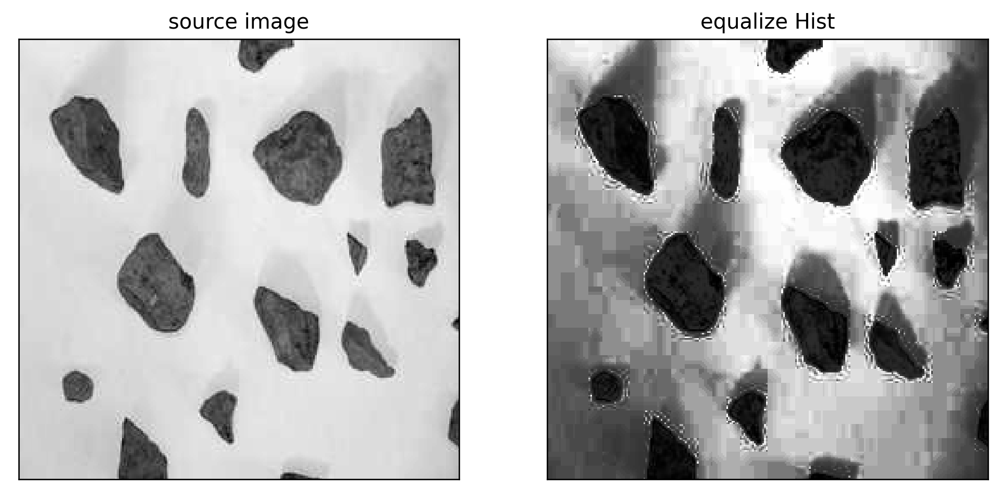

In [3]:
import cv2
from matplotlib import pyplot as plt

frame = cv2.imread('/Users/panyining/Desktop/stones/dataset/0805/IMG_3714.JPG', 0)
frameH = cv2.equalizeHist(frame)
cv2.imwrite('./test_hist2.jpg', cv2.equalizeHist(frame))

plt.figure(figsize=(10, 8), dpi=240)
plt.subplot(121), plt.imshow(frame, 'gray')
plt.title('source image'), plt.xticks([]), plt.yticks([])
plt.subplot(122), plt.imshow(frameH, 'gray')
plt.title('equalize Hist'), plt.xticks([]), plt.yticks([])


# 位数转换

In [47]:
from PIL import Image
imagePath = '/Users/panyining/Desktop/stones/dataset/0806_png/gray2/IMG_3709.png'
file2 = '/Users/panyining/PycharmProjects/stones_detect/img/test_image/IMG_3701_mask_show.png'

im = Image.open(imagePath)
im = Image.fromarray(np.uint8(im)*50)

# im.save(file2)
im.show()

# 通道转换

In [5]:
import cv2
from matplotlib import pyplot as plt
import numpy as np

gray = cv2.imread('/Users/panyining/Desktop/stones/dataset/0806_png/gray/IMG_3701.png', 0)
# gray_BGR = cv2.cvtColor(gray, cv2.COLOR_GRAY2BGR)

image = np.expand_dims(gray, axis=2)
image = np.concatenate((image, image, image), axis=-1)
# cv2.imwrite('10524.jpg', img2)
cv2.imwrite('/Users/panyining/Desktop/IMG_3701_222.png', image)

True

In [45]:
import cv2
imagePath = '/Users/panyining/Desktop/stones/dataset/0806_png/gray2/IMG_3708.png'
imagePath2 = '/Users/panyining/Desktop/stones/dataset/0JSON_TEST/label/label.png'
img1=cv2.imread(imagePath)
for i in range(img1.shape[0]):
    for j in range(img1.shape[1]):
        for k in range(img1.shape[2]):
            if img1[i][j][k] != 0 and img1[i][j][k] != 1:
                print(img1[i][j][k])
#             else:
#                 print('find RGB in 0, 236')
print("img1:",img1.shape)
print("img1:",type(img1))


img1: (512, 512, 3)
img1: <class 'numpy.ndarray'>
